# Итоговый проект по курсу "Архитектор в области ИИ"
# Получение статистики просмотра контента, проигрываемого на экранах, расположенных в общественных местах

## Описание

Идея проекта состоит в том, чтобы получить статистику просмотра того или иного контента, который проигрывается на рекламных экранах. С камеры, расположенной над экраном, получаются фотографии пространства перед экраном за определенный период, продиктованный бизнес-логикой. Например, фотографии производятся в момент проигрывания определенного ролика. Полученные изображения обрабатываются моделями машинного обучения: происходит детекция лиц людей (их количество считается количеством людей, посмотревших ролик), определяется их пол, возраст, раса и эмоция. Эти данные потом отображаются в статистике, которую можно выгрузить в виде отчета. В рамках данной реализации будут рассмотрены только стадии обработки изображений и формирования отчета.

## Цель

Целью данной реализации является разработка сервиса, который на вход получает изображения, а на выходе предоставляет отчет с количеством людей на изображениях, их половозрастной структурой и эмоциями, которые они испытывают.

## Анализ существующих решений

На текущий момент представлен довольно широкий спектр решений для распознавания объектов, обладающих различными лицензиями. Например, [YOLO](https://docs.ultralytics.com) (лицензия AGPL-3.0) для детекции или [Face_info](https://github.com/juan-csv/Face_info) (лицензия MIT) для распознавания атрибутов.
Для реализации проекта в части детекции людей и их классификации воспользуемся библиотекой [deepface](https://github.com/serengil/deepface), так как она "из коробки" поддерживает требуемые нам функции, доволно свежая (последний релиз 17 августа 2024) и имеет лицензию MIT.

## Детекция лиц и анализ их атрибутов с помощью библиотеки DeepFace

### Описание библиотеки

По словам разработчиков, DeepFace - это облегченный фреймворк для распознавания лиц и анализа их атрибутов (возраст, пол, эмоции и раса) для python. Это гибридный фреймворк для распознавания лиц, объединяющий самые современные модели: VGG-Face, FaceNet, Open Face, Deep Face, Deep, ArcFace, Dlib, SFace и GhostFaceNet. Он имеет MIT лицензию, что позволяет нам использовать его беспрепятственно.

### Выбор модели для детекции лиц людей на изображении

Поскольку DeepFace предоставляет несколько библиотек для детекции, в частности opencv, mtcnn, ssd, dlib, retinaface, mediapipe, yolov8, yunet,
fastmtcnn, centerface, протестируем некоторые из них и выберем ту, что нам подходит больше всего. Авторы DeepFace: "Retina Face и MtCnn, похоже, лучше справляются с этапами обнаружения и выравнивания, но они работают намного медленнее. Если скорость вашего конвейера важнее, то вам следует использовать opencv или ssd. С другой стороны, если вы принимаете во внимание точность, то вам следует использовать retin a face или mtcn." Протестируем указанные 4 модели.

Установим и импортируем необходимые библиотеки.

In [1]:
!pip install deepface
!pip install gradio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 6.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.6/108.6 kB 9.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.0/85.0 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 45.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 61.3 MB/s eta 0:00:00
  Created wheel for fire: filename=fire-0.7.0-py3-none-any.whl size=114249 sha256=55bb089cfba5431a5b1d1bff84dd4977717a0df5a559c03c85e4f231ec0475a2
  Stored in directory: /root/.cache/pip/wheels/19/39/2f/2d3cadc408a8804103f1c34ddd4b9f6a93497b11fa96fe738e
Successfully built fire
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.7/56.7 MB 17.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 319.8/319.8 kB 25.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.7/94.7 kB 9.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 447.5/4

In [2]:
from deepface import DeepFace
import pandas as pd
import numpy as np
import os
from pathlib import Path
import datetime as dt
import re
import time
import requests
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
import gc
import gradio as gr

from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px
#import datapane as dp

from tqdm.notebook import tqdm

import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', 50)

24-10-31 14:05:27 - Directory /root/.deepface has been created
24-10-31 14:05:27 - Directory /root/.deepface/weights has been created


Для тестирования детекции были отобраны 5 картинок из Интернета, на которых изображены люди и 3 картинки без людей. Загрузим их и помотрим.

In [3]:
!wget 'https://raw.githubusercontent.com/DmitrievAndrew/AI_Architect/main/final_project/images_to_test_detection.zip'
!unzip images_to_test_detection.zip -d /content/

--2024-10-31 14:05:38--  https://raw.githubusercontent.com/DmitrievAndrew/AI_Architect/main/final_project/images_to_test_detection.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.110.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3975664 (3.8M) [application/zip]
Saving to: ‘images_to_test_detection.zip’

images_to_test_dete 100%[===================>]   3.79M  --.-KB/s    in 0.06s   

2024-10-31 14:05:38 (64.4 MB/s) - ‘images_to_test_detection.zip’ saved [3975664/3975664]

Archive:  images_to_test_detection.zip
   creating: /content/images_to_test_detection/
  inflating: /content/images_to_test_detection/many_faces_1.jpg  
  inflating: /content/images_to_test_detection/many_faces_2.jpg  
  inflating: /content/images_to_test_detection/no_faces_1.jpg  
  inflating: /content/images_to_test_detection/no_faces

In [4]:
images_to_test_detection = sorted(os.listdir('/content/images_to_test_detection/'))

In [5]:
images_to_test_detection

['1_face.jpg',
 '2_faces.jpg',
 '3_faces.jpg',
 'many_faces_1.jpg',
 'many_faces_2.jpg',
 'no_faces_1.jpg',
 'no_faces_2.jpeg',
 'no_faces_3.jpeg']

Изображение: 1_face.jpg


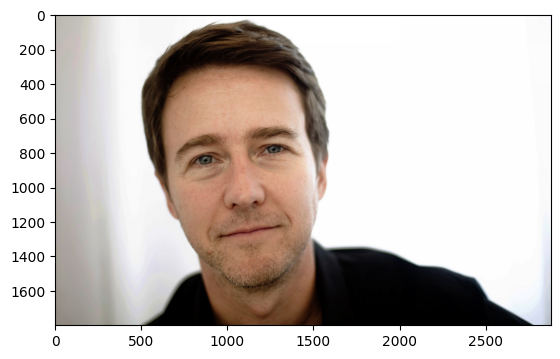


Изображение: 2_faces.jpg


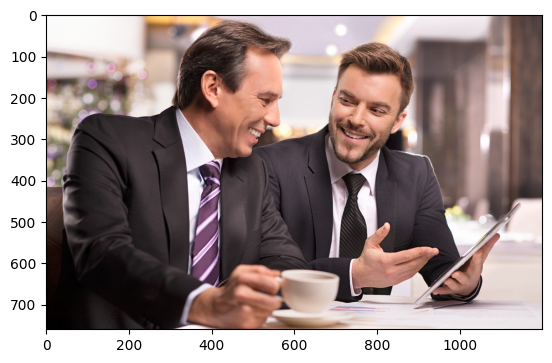


Изображение: 3_faces.jpg


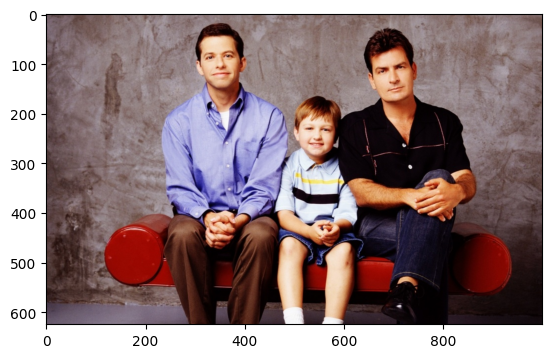


Изображение: many_faces_1.jpg


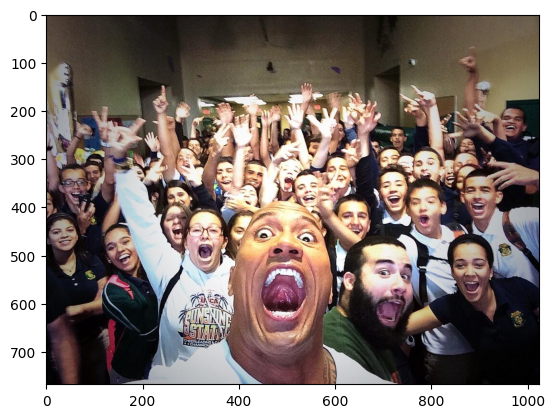


Изображение: many_faces_2.jpg


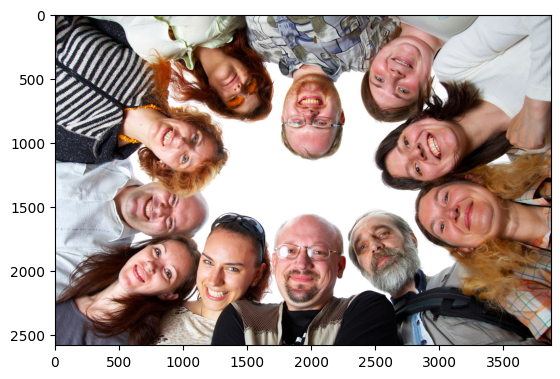


Изображение: no_faces_1.jpg


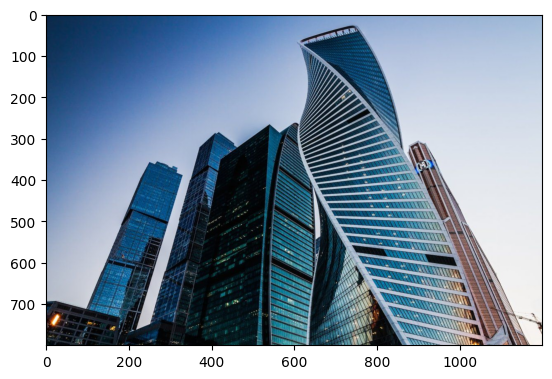


Изображение: no_faces_2.jpeg


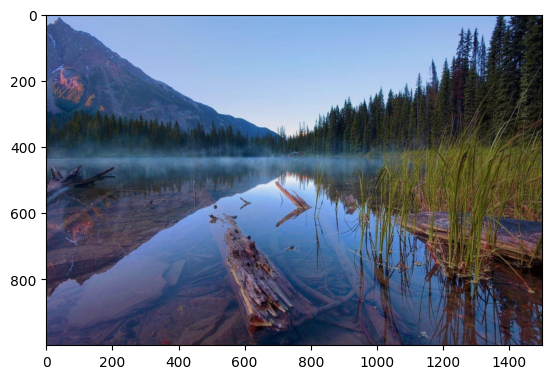


Изображение: no_faces_3.jpeg


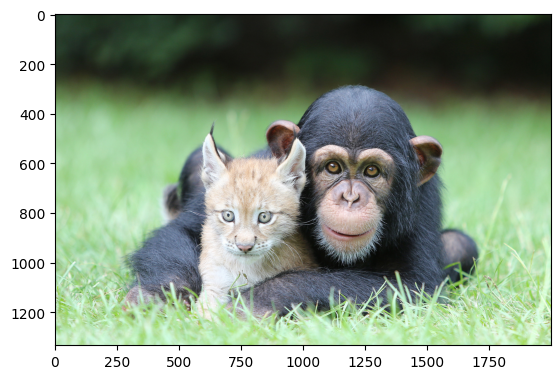

In [6]:
for image in images_to_test_detection:
    img = Image.open(f'/content/images_to_test_detection/{image}')
    print(f'Изображение: {image}')
    plt.imshow(img)
    plt.show()
    print('='*40)
    print()

Для теста выбраны изображения различного разрешения, с различным количеством людей. Протестируем модели для детекции в порядке возрастания сложности: от картинки, где крупно изображено только одно лицо до картинки с большим количеством людей, часть из которых изображены вверх ногами. Оценивать будем "методом глазного яблока", то есть просто визуально оценим качество детекции.

Создадим список моделей для теста и проверим каждую из них на каждом изображении

In [7]:
models = [
  'opencv',
  'ssd',
  'mtcnn',
  'retinaface'
]

24-10-31 14:05:59 - deploy.prototxt will be downloaded...


Downloading...
From: https://github.com/opencv/opencv/raw/3.4.0/samples/dnn/face_detector/deploy.prototxt
To: /root/.deepface/weights/deploy.prototxt
28.1kB [00:00, 45.7MB/s]                   


24-10-31 14:05:59 - res10_300x300_ssd_iter_140000.caffemodel will be downloaded...


Downloading...
From: https://github.com/opencv/opencv_3rdparty/raw/dnn_samples_face_detector_20170830/res10_300x300_ssd_iter_140000.caffemodel
To: /root/.deepface/weights/res10_300x300_ssd_iter_140000.caffemodel
100%|██████████| 10.7M/10.7M [00:00<00:00, 119MB/s]


24-10-31 14:06:32 - retinaface.h5 will be downloaded from the url https://github.com/serengil/deepface_models/releases/download/v1.0/retinaface.h5


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/retinaface.h5
To: /root/.deepface/weights/retinaface.h5
100%|██████████| 119M/119M [00:00<00:00, 121MB/s]


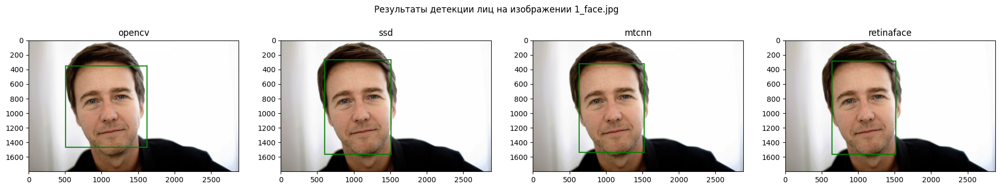

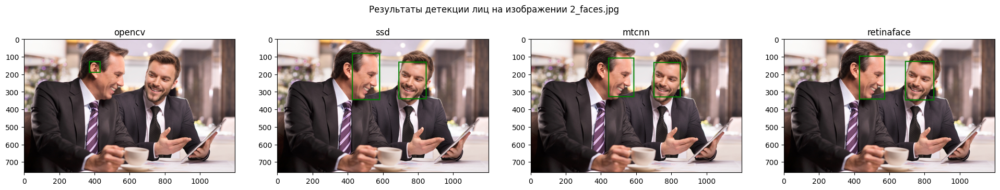

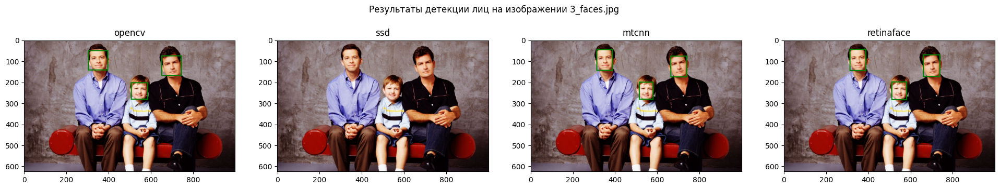

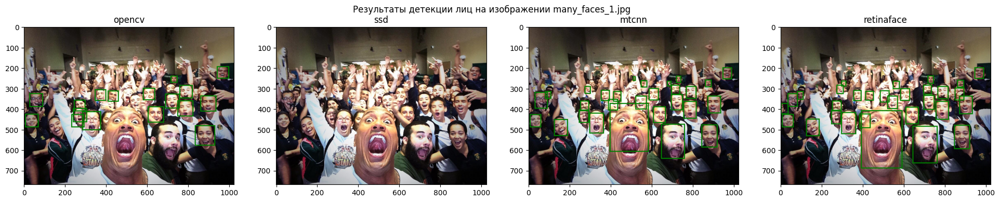

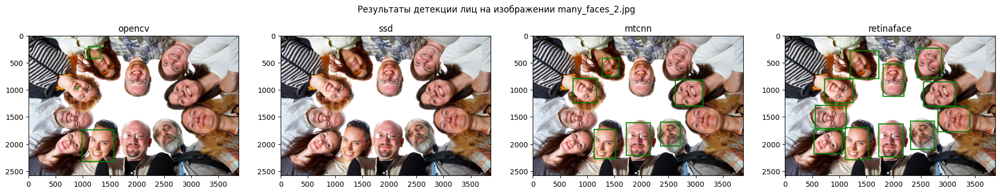

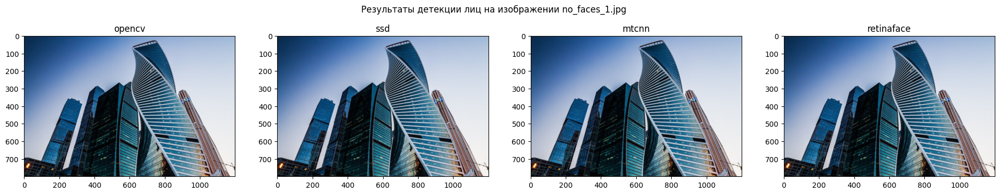

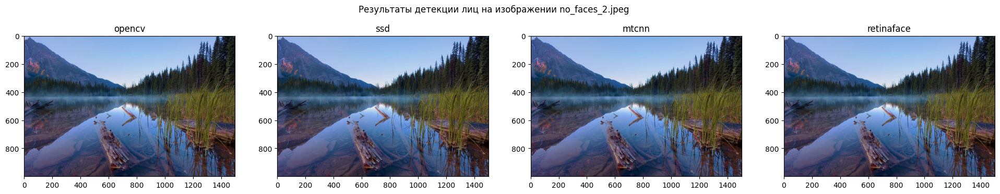

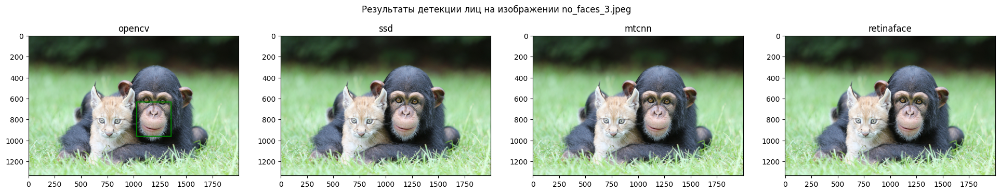

In [8]:
for image in images_to_test_detection:
    fig, axs = plt.subplots(1, 4, figsize=(24, 4))
    for i in range(len(models)):
        # детекция лица
        try:#пробуем найти лица на картинке
            face_objs = DeepFace.extract_faces(
                img_path = f'/content/images_to_test_detection/{image}',
                detector_backend = models[i],
                enforce_detection = True
                )
        except:# вернем пустой словарь, если лиц не нашлось, рамки вокруг объекта не будет
            face_objs = [{'facial_area':{'x': 0,
                                         'y': 0,
                                         'w': 0,
                                         'h': 0,
                                         'left_eye': 0,
                                         'right_eye': 0}}]
        # отрисовка результата
        img = Image.open(f'/content/images_to_test_detection/{image}')
        draw = ImageDraw.Draw(img)
        color = 'green'
        line_widht = int(max(img.size) * 0.005)
        # итерация по каждому найденному объекту
        for res_dict in face_objs:
            x, y, w, h, left_eye, right_eye = res_dict['facial_area'].values()
            draw.rectangle((x, y, x + w, y + h), outline=color, width=line_widht)
        axs[i].set_title(models[i])
        axs[i].imshow(img)

    fig.suptitle(f'Результаты детекции лиц на изображении {image}')
    plt.show()
    print('='*40)

RetinaFace показала себя лучше всего, сумев детектировать даже перевернутые лица. Также она показала себя хорошо при детекции лиц, находящихся на разном расстоянии от камеры. Поэтому выбираем ее как *detector_backend* для дальнейшей реализации.

In [9]:
DETECTOR = 'retinaface'

### Тестирование функции анализа атрибутов лица

Проверим, как работает метод *analyze* на загруженных выше изображениях.

In [10]:
face_objs = DeepFace.analyze(
    img_path = f'/content/images_to_test_detection/3_faces.jpg',
    actions = ['age', 'gender', 'race', 'emotion'],
    detector_backend = DETECTOR,
    silent = True
)

24-10-31 14:10:19 - age_model_weights.h5 will be downloaded...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/age_model_weights.h5
To: /root/.deepface/weights/age_model_weights.h5
100%|██████████| 539M/539M [00:07<00:00, 76.0MB/s]


24-10-31 14:10:29 - gender_model_weights.h5 will be downloaded...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/gender_model_weights.h5
To: /root/.deepface/weights/gender_model_weights.h5
100%|██████████| 537M/537M [00:07<00:00, 71.9MB/s]


24-10-31 14:10:38 - race_model_single_batch.h5 will be downloaded...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/race_model_single_batch.h5
To: /root/.deepface/weights/race_model_single_batch.h5
100%|██████████| 537M/537M [00:07<00:00, 68.5MB/s]


24-10-31 14:10:48 - facial_expression_model_weights.h5 will be downloaded...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/facial_expression_model_weights.h5
To: /root/.deepface/weights/facial_expression_model_weights.h5
100%|██████████| 5.98M/5.98M [00:00<00:00, 102MB/s]


In [11]:
print(len(face_objs))
face_objs


3


[{'age': 32,
  'region': {'x': 657,
   'y': 68,
   'w': 82,
   'h': 107,
   'left_eye': (715, 107),
   'right_eye': (677, 117)},
  'face_confidence': 1.0,
  'gender': {'Woman': 0.005516607780009508, 'Man': 99.9944806098938},
  'dominant_gender': 'Man',
  'race': {'asian': 0.19255954572221093,
   'indian': 0.5048019675401488,
   'black': 0.03668549615354882,
   'white': 66.84358515219866,
   'middle eastern': 15.7111849533099,
   'latino hispanic': 16.71117493973077},
  'dominant_race': 'white',
  'emotion': {'angry': 67.02901721000671,
   'disgust': 6.120307034507277e-05,
   'fear': 0.3084838856011629,
   'happy': 0.2740305382758379,
   'sad': 7.588048279285431,
   'surprise': 0.0040281716792378575,
   'neutral': 24.79632794857025},
  'dominant_emotion': 'angry'},
 {'age': 30,
  'region': {'x': 310,
   'y': 42,
   'w': 79,
   'h': 105,
   'left_eye': (367, 83),
   'right_eye': (331, 88)},
  'face_confidence': 1.0,
  'gender': {'Woman': 1.016794890165329, 'Man': 98.98320436477661},
  'd

Метод вернул нам список из трех словарей, в каждом из которых указаны атрибуты лица.

In [12]:
def print_faces(face_objs, image_path):
    # открыть картинку и создать объект для рисования
    pil_image = Image.open(image_path)
    draw = ImageDraw.Draw(pil_image)

    line_widht = int(max(pil_image.size) * 0.003)
    font_size = int(max(pil_image.size) * 0.015)

    # настройки отрисовки
    color = 'red'
    font_path = 'LiberationMono-Regular.ttf'
    font = ImageFont.truetype(str(font_path), size=font_size)
    big_font = ImageFont.truetype(str(font_path), size=2*font_size)

    # итерация по словарям для каждого лица
    for i, res_dict in enumerate(face_objs):
        # извлечение артибутов
        age = res_dict['age']
        x, y, w, h, left_eye, right_eye = res_dict['region'].values()
        gender = res_dict['dominant_gender']
        race = res_dict['dominant_race']
        emotion = res_dict['dominant_emotion']
        text_age = f'Возраст:{age}'
        text_gender = f'Пол:{gender}'
        text_race = f'Раса:{race}'
        text_emo = f'Эмоция:{emotion}'

        # отрисовка боксов и надписей
        draw.rectangle((x, y, x + w, y + h), outline=color, width=line_widht)
        draw.text(xy=(x + 10, y + 2*font_size), text=str(i), font=big_font, fill=color, anchor="lb")
        draw.text(xy=(x, y - font_size), text=text_gender, font=font, fill=color, anchor="lb")
        draw.text(xy=(x, y), text=text_age, font=font, fill=color, anchor="lb")
        draw.text(xy=(x, y + h + font_size), text=text_race, font=font, fill=color, anchor="lb")
        draw.text(xy=(x, y + h + 2*font_size), text=text_emo, font=font, fill=color, anchor="lb")

    plt.figure(figsize=(14, 10))
    plt.imshow(pil_image)
    plt.show()

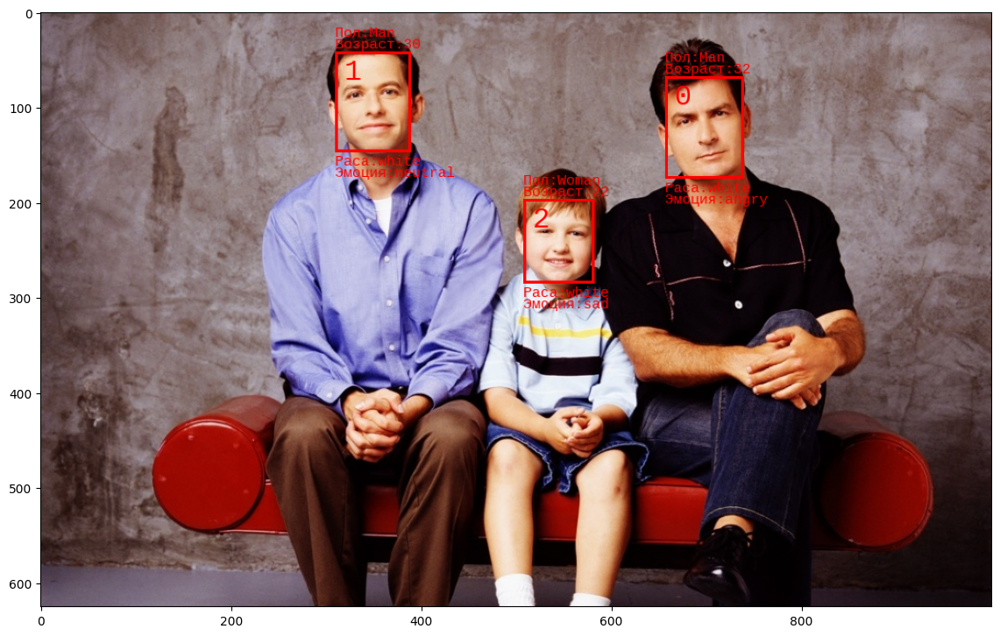

In [13]:
print_faces(face_objs, '/content/images_to_test_detection/3_faces.jpg')

На картинке два взрослух мужчины и мальчик. Мужчин модель определила верно, а вот мальчика распознала как женщину 22 лет. По расам тоже все верно, а вот по эмоциям есть сомнения, хотя разные люди выражают эмоции по-разному. Попробуем картинку без лиц.

In [14]:
try:
    face_objs = DeepFace.analyze(
        img_path = f'/content/images_to_test_detection/no_faces_1.jpg',
        actions = ['age', 'gender', 'race', 'emotion'],
        detector_backend = DETECTOR,
        silent = True
    )
except ValueError:
    print('Лиц на изображении не обнарежено')

Лиц на изображении не обнарежено


Метод падает с ошибкой *ValueError*, это значит, что лиц не найдено на изображении, и мы выводим соответствующее сообщение на экран.

In [15]:
%%time
face_objs = DeepFace.analyze(
    img_path = f'/content/images_to_test_detection/many_faces_2.jpg',
    actions = ['age', 'gender', 'race', 'emotion'],
    detector_backend = DETECTOR,
    silent = True
)

CPU times: user 47.4 s, sys: 3.12 s, total: 50.5 s
Wall time: 50.7 s


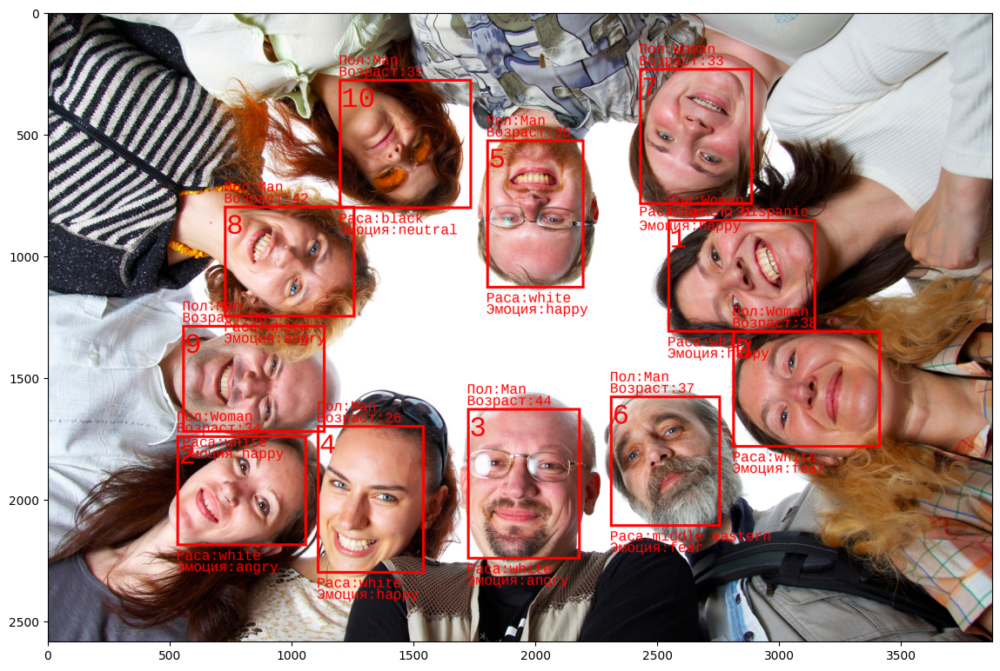

In [16]:
print_faces(face_objs, '/content/images_to_test_detection/many_faces_2.jpg')

В целом библиотека работает удовлетворительно. Есть ошибки с определением пола (об этом можно сказать с большой долей вероятности, т.к. мы сами довольно хорошо можем определить пол): женщины 4, 8, 10 определены как мужчины. Видимо есть ошибки с определением возраста, расы и эмоций (об этом судить сложнее, т.к. тяжело судить о возрасте по фотографии): мужчина 6 выглядит старше указанных 37 лет, а женщина 10 явно не black. В остальных случаях результат выглядит похожим на правду.

### Объединение результатов детекции и классификации в DataFrame

Загрузим заранее подготовленные изожбражения, которые моделируют фотографии с камеры. Названием каждой картинки является время, когда сделано фото. На изображениях могут быть люди, один или несколько, а может и не быть людей.

In [17]:
!wget 'https://raw.githubusercontent.com/DmitrievAndrew/AI_Architect/main/final_project/images_to_stat_test.zip'
!unzip images_to_stat_test.zip -d /content/

--2024-10-31 14:11:43--  https://raw.githubusercontent.com/DmitrievAndrew/AI_Architect/main/final_project/images_to_stat_test.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5438748 (5.2M) [application/zip]
Saving to: ‘images_to_stat_test.zip’

images_to_stat_test 100%[===================>]   5.19M  --.-KB/s    in 0.06s   

2024-10-31 14:11:43 (85.2 MB/s) - ‘images_to_stat_test.zip’ saved [5438748/5438748]

Archive:  images_to_stat_test.zip
   creating: /content/images_to_stat_test/
  inflating: /content/images_to_stat_test/2024-10-24 17:25:00.jpeg  
  inflating: /content/images_to_stat_test/2024-10-24 13:20:00.jpg  
  inflating: /content/images_to_stat_test/2024-10-24 13:40:00.jpg  
  inflating: /content/images_to_stat_test/2024-10-24 18:20:00.jpg  
  i

In [18]:
images_to_stat_test = sorted(os.listdir('/content/images_to_stat_test/'))
images_to_stat_test

['2024-10-24 13:00:00.jpg',
 '2024-10-24 13:10:00.jpg',
 '2024-10-24 13:20:00.jpg',
 '2024-10-24 13:30:00.jpg',
 '2024-10-24 13:40:00.jpg',
 '2024-10-24 13:50:00.jpg',
 '2024-10-24 14:00:00.jpg',
 '2024-10-24 14:10:00.jpg',
 '2024-10-24 14:20:00.jpg',
 '2024-10-24 14:30:00.jpeg',
 '2024-10-24 14:40:00.jpg',
 '2024-10-24 14:50:00.jpg',
 '2024-10-24 15:00:00.jpg',
 '2024-10-24 15:20:00.jpeg',
 '2024-10-24 15:30:00.jpg',
 '2024-10-24 15:40:00.jpg',
 '2024-10-24 15:50:00.jpg',
 '2024-10-24 16:10:00.jpg',
 '2024-10-24 16:20:00.jpg',
 '2024-10-24 16:30:00.jpeg',
 '2024-10-24 17:25:00.jpeg',
 '2024-10-24 17:35:00.jpeg',
 '2024-10-24 17:38:00.jpg',
 '2024-10-24 18:20:00.jpg']

Посмотрим примеры изображений.

Изображение: 2024-10-24 13:00:00.jpg


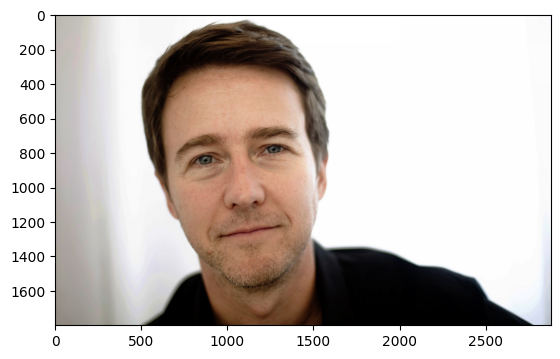


Изображение: 2024-10-24 13:10:00.jpg


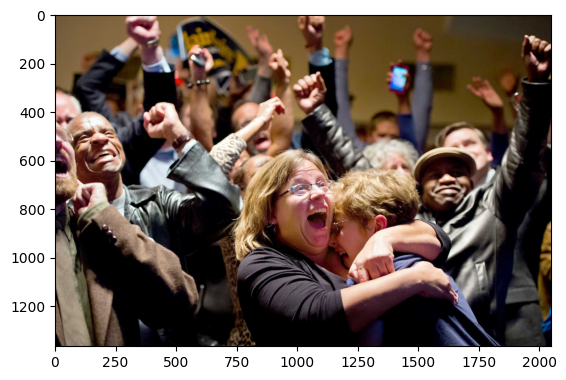


Изображение: 2024-10-24 13:20:00.jpg


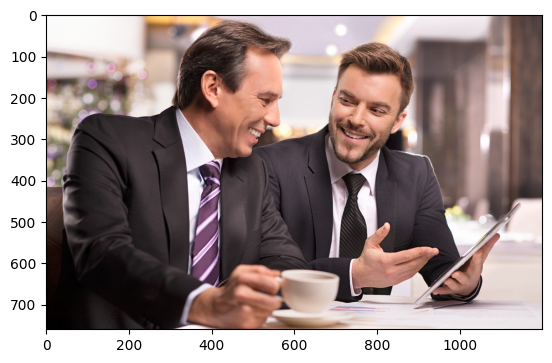

In [19]:
for i in range(3):
    img = Image.open(f'/content/images_to_stat_test/{images_to_stat_test[i]}')
    print(f'Изображение: {images_to_stat_test[i]}')
    plt.imshow(img)
    plt.show()
    print('='*40)
    print()

Напишем функцию, которая на вход принимает путь к файлам, а возвращает датафрейм с результатом обработки изображений.

In [20]:
def get_statistic(images_path):
    '''
    Функция на вход принимает путь к файлам, а возвращает датафрейм
    с результатом обработки изображений
    '''
    # создаем пустой список для запиcи результатов
    result_lst = []
    # создаем список картинок
    images = os.listdir(images_path)
    for image in tqdm(images):
        img_path = f'{images_path}{image}'
        # получим дату из названия
        datetime = image.split('.')[0]
        # получим данные из изображений
        try:
            face_objs = DeepFace.analyze(
                img_path = img_path,
                actions = ['age', 'gender', 'race', 'emotion'],
                detector_backend = DETECTOR,
                silent = True
                )

        except ValueError:
            face_objs = [{'region':{'x': 0,
                                         'y': 0,
                                         'w': 0,
                                         'h': 0,
                                         'left_eye': 0,
                                         'right_eye': 0},
                          'age': np.nan,
                          'dominant_gender': np.nan,
                          'dominant_race': np.nan,
                          'dominant_emotion': np.nan}]

            print(f'Лиц на изображении {image} не обнаружено')
        # выберем нужные данные из каждого словаря с результатами
        # добавим даты из названия в каждый найденный объект
        res_face_objs = []
        needed_keys = ['region', 'age', 'dominant_gender', 'dominant_race', 'dominant_emotion']
        for res_dict in face_objs:
            new_dict = dict((k, res_dict[k]) for k in needed_keys if k in res_dict)
            new_dict['img_name'] = image
            new_dict['img_path'] = img_path
            new_dict['datetime'] = datetime
            res_face_objs.append(new_dict)
            del new_dict
        del face_objs
        # добавим результаты в список
        result_lst.extend(res_face_objs)
        del res_face_objs

    # создадим датафрейм с результатами
    df = pd.DataFrame(result_lst)
    # выведем на экран случайное изображение для контроля результатов
    image_to_print = np.random.choice(df['img_path'])
    face_objs = df[df['img_path'] == image_to_print].to_dict(orient='records')
    print_faces(face_objs, image_to_print)

    df = df.reset_index()
    df = df.rename(columns={
        'dominant_gender': 'gender',
        'dominant_race': 'race',
        'dominant_emotion': 'emotion',
        'index': 'id'
    })
    # Постобработка
    df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
    df['date'] = df['datetime'].dt.round('h')
    df['age'] = df['age'].astype('Int32')

    return df

In [21]:
gc.collect()

76828

  0%|          | 0/24 [00:00<?, ?it/s]

Лиц на изображении 2024-10-24 17:35:00.jpeg не обнаружено
Лиц на изображении 2024-10-24 18:20:00.jpg не обнаружено


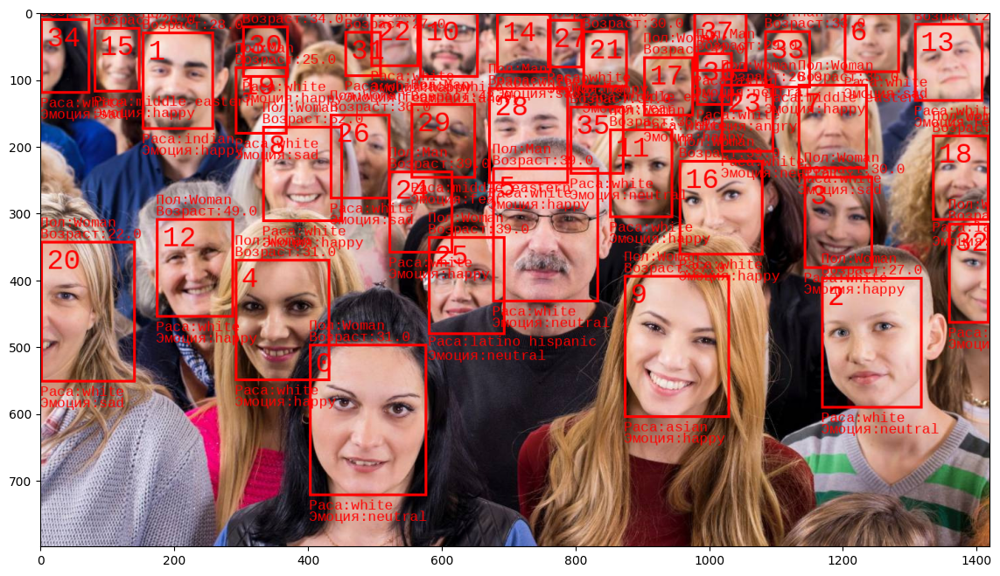

In [22]:
df = get_statistic(f'/content/images_to_stat_test/')

In [23]:
df

,id,region,age,gender,race,emotion,img_name,img_path,datetime,date
0,0,"{'x': 201, 'y': 396, 'w': 235, 'h': 269, 'left...",28,Woman,white,happy,2024-10-24 15:30:00.jpg,/content/images_to_stat_test/2024-10-24 15:30:...,2024-10-24 15:30:00,2024-10-24 16:00:00
1,1,"{'x': 462, 'y': 253, 'w': 192, 'h': 257, 'left...",21,Man,white,happy,2024-10-24 15:30:00.jpg,/content/images_to_stat_test/2024-10-24 15:30:...,2024-10-24 15:30:00,2024-10-24 16:00:00
2,2,"{'x': 956, 'y': 269, 'w': 149, 'h': 182, 'left...",25,Man,asian,fear,2024-10-24 15:30:00.jpg,/content/images_to_stat_test/2024-10-24 15:30:...,2024-10-24 15:30:00,2024-10-24 16:00:00
3,3,"{'x': 292, 'y': 295, 'w': 149, 'h': 179, 'left...",32,Woman,white,sad,2024-10-24 15:30:00.jpg,/content/images_to_stat_test/2024-10-24 15:30:...,2024-10-24 15:30:00,2024-10-24 16:00:00
4,4,"{'x': 734, 'y': 335, 'w': 175, 'h': 227, 'left...",34,Man,white,happy,2024-10-24 15:30:00.jpg,/content/images_to_stat_test/2024-10-24 15:30:...,2024-10-24 15:30:00,2024-10-24 16:00:00
...,...,...,...,...,...,...,...,...,...,...
521,521,"{'x': 264, 'y': 186, 'w': 80, 'h': 113, 'left_...",31,Woman,middle eastern,happy,2024-10-24 15:40:00.jpg,/content/images_to_stat_test/2024-10-24 15:40:...,2024-10-24 15:40:00,2024-10-24 16:00:00
522,522,"{'x': 753, 'y': 78, 'w': 91, 'h': 130, 'left_e...",39,Man,white,happy,2024-10-24 15:40:00.jpg,/content/images_to_stat_test/2024-10-24 15:40:...,2024-10-24 15:40:00,2024-10-24 16:00:00
523,523,"{'x': 213, 'y': 65, 'w': 83, 'h': 108, 'left_e...",29,Man,white,happy,2024-10-24 15:40:00.jpg,/content/images_to_stat_test/2024-10-24 15:40:...,2024-10-24 15:40:00,2024-10-24 16:00:00
524,524,"{'x': 0, 'y': 243, 'w': 79, 'h': 112, 'left_ey...",27,Woman,latino hispanic,happy,2024-10-24 15:40:00.jpg,/content/images_to_stat_test/2024-10-24 15:40:...,2024-10-24 15:40:00,2024-10-24 16:00:00


In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 526 entries, 0 to 525
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   id        526 non-null    int64         
 1   region    526 non-null    object        
 2   age       524 non-null    Int32         
 3   gender    524 non-null    object        
 4   race      524 non-null    object        
 5   emotion   524 non-null    object        
 6   img_name  526 non-null    object        
 7   img_path  526 non-null    object        
 8   datetime  526 non-null    datetime64[ns]
 9   date      526 non-null    datetime64[ns]
dtypes: Int32(1), datetime64[ns](2), int64(1), object(6)
memory usage: 39.7+ KB


### Графики

Подготовим графики, которые будем выводить в интерфейсе.

Подготовим таблицу с очищенной статистикой.

In [25]:
tb1 = df[['id', 'datetime', 'date', 'age', 'gender', 'race', 'emotion']]
tb1

,id,datetime,date,age,gender,race,emotion
0,0,2024-10-24 15:30:00,2024-10-24 16:00:00,28,Woman,white,happy
1,1,2024-10-24 15:30:00,2024-10-24 16:00:00,21,Man,white,happy
2,2,2024-10-24 15:30:00,2024-10-24 16:00:00,25,Man,asian,fear
3,3,2024-10-24 15:30:00,2024-10-24 16:00:00,32,Woman,white,sad
4,4,2024-10-24 15:30:00,2024-10-24 16:00:00,34,Man,white,happy
...,...,...,...,...,...,...,...
521,521,2024-10-24 15:40:00,2024-10-24 16:00:00,31,Woman,middle eastern,happy
522,522,2024-10-24 15:40:00,2024-10-24 16:00:00,39,Man,white,happy
523,523,2024-10-24 15:40:00,2024-10-24 16:00:00,29,Man,white,happy
524,524,2024-10-24 15:40:00,2024-10-24 16:00:00,27,Woman,latino hispanic,happy


Построим график почавого количества людей на изображениях, подготовив вспомогательный датасет.

In [26]:
data1 = df.groupby('date')['id'].count().reset_index()

In [27]:
fig1 = go.Figure()
fig1.add_trace(go.Scatter(x=data1['date'], y=data1['id'],
                    mode='lines+markers',
                    name='Количество',
                    marker_color = 'indianred'))
fig1.update_xaxes(title_text = "Дата")
fig1.update_yaxes(title_text = "Количество")

fig1.update_layout(
    title_text="Количество людей на изображениях",
    autosize=False,
    width=1200,
    height=600)
fig1.show()

Построим график распределения людей по полу, подготовив дополнительный датасет.

In [28]:
data2 = df.groupby('gender')['id'].count().reset_index()

In [29]:
fig2 = go.Figure()
fig2.add_trace(go.Bar(x=data2['gender'],
                      y=data2['id'],
                      text=data2['id'],
                      textposition='auto',
                      marker_color='lightsalmon'))
fig2.update_xaxes(title_text = "Пол")
fig2.update_yaxes(title_text = "Количество")

fig2.update_layout(
    title_text='Пол людей',
    autosize=False,
    width=600,
    height=600)
fig2.show()

Построим гистограмму распределения людей по возрасту.

In [30]:
fig3 = go.Figure()
fig3.add_trace(go.Histogram(x=df.loc[df['gender'] == 'Man', 'age'],
                            name='Мужчины',
                            marker_color='lightsalmon'))
fig3.add_trace(go.Histogram(x=df.loc[df['gender'] == 'Woman', 'age'],
                            name='Женщины',
                            marker_color='indianred'))
fig3.update_xaxes(title_text = "Возраст")
fig3.update_yaxes(title_text = "Количество")

fig3.update_layout(
    title_text='Гистограмма возраста',
    barmode='stack',
    autosize=False,
    width=600,
    height=600)
fig3.show()

Построим график распределения эмоций людей, подготовив дополнительный датасет.

In [31]:
data4 = df.groupby('emotion')['id'].count().reset_index()

In [32]:
fig4 = go.Figure()
fig4.add_trace(go.Bar(x=data4['emotion'],
                      y=data4['id'],
                      text=data4['id'],
                      textposition='auto',
                      marker_color='lightsalmon'))

fig4.update_xaxes(title_text = "Эмоции")
fig4.update_yaxes(title_text = "Количество")

fig4.update_layout(
    title_text='Эмоции людей',
    autosize=False,
    width=600,
    height=600)
fig4.show()

Построим график распределения людей по расам, подготовив дополнительный датасет.

In [33]:
data5 = df.groupby('race')['id'].count().reset_index()

In [34]:
fig5 = go.Figure()
fig5.add_trace(go.Bar(x=data5['race'],
                      y=data5['id'],
                      text=data5['id'],
                      textposition='auto',
                      marker_color='lightsalmon'))

fig5.update_xaxes(title_text = "Расы")
fig5.update_yaxes(title_text = "Количество")

fig5.update_layout(
    title_text='Расы людей',
    autosize=False,
    width=600,
    height=600)
fig5.show()

Соберем все графики для удобного размещения в интерфейсе.

In [35]:
fig = make_subplots(
    rows=3, cols=2,
    specs=[[{"colspan": 2}, None],
           [{}, {}],
           [{}, {}]],
    subplot_titles=('Количество людей',
                    'Гистограмма возраста',
                    'Пол',
                    'Эмоции',
                    'Расы'),
    shared_xaxes=False,
    vertical_spacing=0.1)
# Количество людей
fig.add_trace(go.Scatter(x=data1['date'], y=data1['id'],
                    mode='lines+markers',
                    name='Количество людей',
                    marker_color = 'indianred'), row=1, col=1)
fig.update_xaxes(title_text = "Дата", row=1, col=1)
fig.update_yaxes(title_text = "Количество", row=1, col=1)
# Гистограмма возраста
fig.add_trace(go.Histogram(x=df.loc[df['gender'] == 'Man', 'age'],
                            name='Мужчины',
                            marker_color='lightsalmon'),row=2, col=1)
fig.add_trace(go.Histogram(x=df.loc[df['gender'] == 'Woman', 'age'],
                            name='Женщины',
                            marker_color='indianred'), row=2, col=1)
fig.update_xaxes(title_text = "Возраст", row=2, col=1)
fig.update_yaxes(title_text = "Количество", row=2, col=1)
# Пол
fig.add_trace(go.Bar(x=data2['gender'],
                      y=data2['id'],
                      text=data2['id'],
                      textposition='auto',
                      marker_color='lightsalmon'), row=2, col=2)
fig.update_xaxes(title_text = "Пол", row=2, col=2)
fig.update_yaxes(title_text = "Количество", row=2, col=2)
# Эмоции
fig.add_trace(go.Bar(x=data4['emotion'],
                      y=data4['id'],
                      text=data4['id'],
                      textposition='auto',
                      marker_color='lightsalmon'), row=3, col=1)
fig.update_xaxes(title_text = "Эмоции", row=3, col=1)
fig.update_yaxes(title_text = "Количество", row=3, col=1)
# Расы
fig.add_trace(go.Bar(x=data5['race'],
                      y=data5['id'],
                      text=data5['id'],
                      textposition='auto',
                      marker_color='lightsalmon'), row=3, col=2)

fig.update_xaxes(title_text = "Расы", row=3, col=2)
fig.update_yaxes(title_text = "Количество", row=3, col=2)




fig.update_layout(
    showlegend=False,
    title_text='Графики атрибутов',
    barmode='stack',
    autosize=False,
    width=1200,
    height=1200
    )

### Приложение на Gradio

Напишем приложение с помощью библиотеки *Gradio*, реализовав весь описанный ранее функционал.

In [36]:
def get_download_btn(inp_file=None, is_raw_file=True):
    if is_raw_file:
        label = 'Скачать полный результат в формате .csv'
    else:
        label = 'Скачать статистику в формате .csv'
    download_btn = gr.DownloadButton(
        label=label,
        value=inp_file,
        visible=inp_file is not None,
        )
    return download_btn

def print_faces(face_objs, image_path):
    # открыть картинку и создать объект для рисования
    pil_image = Image.open(image_path)
    draw = ImageDraw.Draw(pil_image)

    line_widht = int(max(pil_image.size) * 0.003)
    font_size = int(max(pil_image.size) * 0.015)

    # настройки отрисовки
    color = 'red'
    font_path = 'LiberationMono-Regular.ttf'
    font = ImageFont.truetype(str(font_path), size=font_size)
    big_font = ImageFont.truetype(str(font_path), size=2*font_size)

    # итерация по словарям для каждого лица
    for i, res_dict in enumerate(face_objs):
        # извлечение артибутов
        age = res_dict['age']
        x, y, w, h, left_eye, right_eye = res_dict['region'].values()
        gender = res_dict['dominant_gender']
        race = res_dict['dominant_race']
        emotion = res_dict['dominant_emotion']
        text_age = f'Возраст:{age}'
        text_gender = f'Пол:{gender}'
        text_race = f'Раса:{race}'
        text_emo = f'Эмоция:{emotion}'

        # отрисовка боксов и надписей
        draw.rectangle((x, y, x + w, y + h), outline=color, width=line_widht)
        draw.text(xy=(x + 10, y + 2*font_size), text=str(i), font=big_font, fill=color, anchor="lb")
        draw.text(xy=(x, y - font_size), text=text_gender, font=font, fill=color, anchor="lb")
        draw.text(xy=(x, y), text=text_age, font=font, fill=color, anchor="lb")
        draw.text(xy=(x, y + h + font_size), text=text_race, font=font, fill=color, anchor="lb")
        draw.text(xy=(x, y + h + 2*font_size), text=text_emo, font=font, fill=color, anchor="lb")

    return pil_image

def get_stat(images_path):
    '''
    Функция на вход принимает путь к файлам, а возвращает датафрейм
    с результатом обработки изображений
    '''
    # создаем пустой список для запиcи результатов

    result_lst = []
    result_image = np.nan
    # создаем список картинок
    for image in images_path:
        # получим дату из названия
        datetime = image.split('/')[-1].split('.')[0]
        # получим данные из изображений
        try:
            face_objs = DeepFace.analyze(
                img_path = image,
                actions = ['age', 'gender', 'race', 'emotion'],
                detector_backend = 'retinaface',
                silent = True
                )
            if pd.isna(result_image):
                result_image = print_faces(face_objs, image)

        except ValueError:
            face_objs = [{'region':{'x': 0,
                                         'y': 0,
                                         'w': 0,
                                         'h': 0,
                                         'left_eye': 0,
                                         'right_eye': 0},
                          'age': np.nan,
                          'dominant_gender': np.nan,
                          'dominant_race': np.nan,
                          'dominant_emotion': np.nan}]
        res_face_objs = []
        needed_keys = ['region', 'age', 'dominant_gender', 'dominant_race', 'dominant_emotion']
        for res_dict in face_objs:
            new_dict = dict((k, res_dict[k]) for k in needed_keys if k in res_dict)
            new_dict['img_name'] = image.split('/')[-1]
            new_dict['img_path'] = image
            new_dict['datetime'] = datetime
            res_face_objs.append(new_dict)
            del new_dict
        del face_objs
        # добавим результаты в список
        result_lst.extend(res_face_objs)
        del res_face_objs
    df = pd.DataFrame(result_lst)

    df = df.reset_index()
    df = df.rename(columns={
        'dominant_gender': 'gender',
        'dominant_race': 'race',
        'dominant_emotion': 'emotion',
        'index': 'id'
    })

    answer = f'''
    Проанализировано изображений: {len(images_path)}.
    Найдено людей: {len(df.dropna(subset='age'))}.
    '''

    df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
    df['date'] = df['datetime'].dt.round('h')
    df['age'] = df['age'].astype('Int32')

    df.to_csv('raw_result.csv', index=False)
    df[['id', 'datetime', 'date', 'age', 'gender', 'race', 'emotion']].to_csv('clean_result.csv', index=False)



#=========Графики=======
    data1 = df.groupby('date')['id'].count().reset_index()
    data2 = df.groupby('gender')['id'].count().reset_index()
    data4 = df.groupby('emotion')['id'].count().reset_index()
    data5 = df.groupby('race')['id'].count().reset_index()
    fig = make_subplots(
    rows=3, cols=2,
    specs=[[{"colspan": 2}, None],
           [{}, {}],
           [{}, {}]],
    subplot_titles=('Количество людей',
                    'Гистограмма возраста',
                    'Пол',
                    'Эмоции',
                    'Расы'),
    shared_xaxes=False,
    vertical_spacing=0.1)
    # Количество людей
    fig.add_trace(go.Scatter(x=data1['date'], y=data1['id'],
                        mode='lines+markers',
                        name='Количество людей',
                        marker_color = 'indianred'), row=1, col=1)
    fig.update_xaxes(title_text = "Дата", row=1, col=1)
    fig.update_yaxes(title_text = "Количество", row=1, col=1)
    # Гистограмма возраста
    fig.add_trace(go.Histogram(x=df.loc[df['gender'] == 'Man', 'age'],
                                name='Мужчины',
                                marker_color='lightsalmon'),row=2, col=1)
    fig.add_trace(go.Histogram(x=df.loc[df['gender'] == 'Woman', 'age'],
                                name='Женщины',
                                marker_color='indianred'), row=2, col=1)
    fig.update_xaxes(title_text = "Возраст", row=2, col=1)
    fig.update_yaxes(title_text = "Количество", row=2, col=1)
    # Пол
    fig.add_trace(go.Bar(x=data2['gender'],
                        y=data2['id'],
                        text=data2['id'],
                        textposition='auto',
                        name='Пол',
                        marker_color='lightsalmon'), row=2, col=2)
    fig.update_xaxes(title_text = "Пол", row=2, col=2)
    fig.update_yaxes(title_text = "Количество", row=2, col=2)
    # Эмоции
    fig.add_trace(go.Bar(x=data4['emotion'],
                        y=data4['id'],
                        text=data4['id'],
                        textposition='auto',
                        name='Эмоция',
                        marker_color='lightsalmon'), row=3, col=1)
    fig.update_xaxes(title_text = "Эмоции", row=3, col=1)
    fig.update_yaxes(title_text = "Количество", row=3, col=1)
    # Расы
    fig.add_trace(go.Bar(x=data5['race'],
                        y=data5['id'],
                        text=data5['id'],
                        textposition='auto',
                        name='Раса',
                        marker_color='lightsalmon'), row=3, col=2)

    fig.update_xaxes(title_text = "Расы", row=3, col=2)
    fig.update_yaxes(title_text = "Количество", row=3, col=2)

    fig.update_layout(
        showlegend=False,
        title_text='Графики атрибутов',
        barmode='stack',
        autosize=False,
        width=1000,
        height=1200
        )

    return df, answer, result_image, fig

with gr.Blocks(theme=gr.themes.Citrus()) as demo:
    # состояние с путем до файла
    raw_result_path = gr.State('raw_result.csv')
    clean_result_path = gr.State('clean_result.csv')
    is_raw_file = gr.State(False)
    gr.Markdown(
    """
    # Определение количества людей на изображениях, их пола, возраста, расы и эмоций
    Укажите директорию с изображениями, которые вы хотите обработать.
    """
    )
    with gr.Tab('Обзор'):
        inp = gr.Files(file_count='directory')
        btn = gr.Button("Получить результат")
        res_text = gr.Textbox(label="Результаты")
        with gr.Row():
            with gr.Column():
                res_data = gr.Dataframe()
                raw_download_btn = get_download_btn(inp_file=None)
                clean_download_btn = get_download_btn(inp_file=None)
            res_img = gr.Image(label='Пример изображения')

    with gr.Tab('Графики атрибутов'):
        plot = gr.Plot()

    out = [res_data, res_text, res_img, plot]
    clean_dbtn_inp = [clean_result_path, is_raw_file]
    btn.click(
        fn=get_stat,
        inputs=inp,
        outputs=out,
    ).success(
        fn=get_download_btn,
        inputs=[raw_result_path],
        outputs=raw_download_btn
    ).success(
        fn=get_download_btn,
        inputs=clean_dbtn_inp,
        outputs=clean_download_btn
    )

    raw_download_btn.click(
        lambda path: None,
        inputs=[raw_result_path],
        outputs=None
    )
    clean_download_btn.click(
    lambda path: None,
    inputs=[clean_result_path],
    outputs=None
    )
demo.launch(debug=True)

Running Gradio in a Colab notebook requires sharing enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
* Running on public URL: https://5e56ab918add207d89.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


Keyboard interruption in main thread... closing server.
Killing tunnel 127.0.0.1:7860 <> https://5e56ab918add207d89.gradio.live


Структура проекта для размещения на платформе HuggingFace Выглядит следующим образом:

 - `requirements.txt`
 - `app.py`
 - `LiberationMono-Regular.ttf`

Содержимое файла `requirements.txt`:
```
pandas==2.2.2
numpy==1.26.4
deepface==0.0.93
gradio==5.4.0
plotly==5.24.1
matplotlib==3.7.1
pillow==10.4.0
tf-keras
```


Ссылка на приложение https://huggingface.co/spaces/AndrewD123/face_recognition

Также соберем образ `Docker` для возможности развертывания приложения локально и на виртуальных машинах.

**Структура:**
 - `requirements.txt`
 - `app.py`
 - `LiberationMono-Regular.ttf`
 - `Dockerfile`


Содержимое `Dockerfile`:
```
FROM python:3.10
WORKDIR /app
COPY requirements.txt .
RUN apt-get update && apt-get install ffmpeg libsm6 libxext6  -y
RUN pip install --upgrade pip
RUN pip install --no-cache-dir -r requirements.txt
COPY . .
EXPOSE 7860
ENV GRADIO_SERVER_NAME="0.0.0.0"
CMD ["python3", "app.py"]
```

## Выводы

Результатом проведенной работы стала реализация приложения, которое:
- имеет веб-интерфейс;
- позволяет обрабатывать несколько изображений, проводя детекцию лиц и анализ их атрибутов;
- позволяет скачивать результаты обработки в виде *.csv* файла;
- выводит на экран интерактивные графики, которые дают представление об обработанных изображениях.

Приложение написано на языке `Python` с помощью библиотеки `Gradio`. Детекция лиц и анализ атрибутов выполняются средствами библиотеки `DeepFace`. Графики построены с помощью `Plotly`. Приложение довольно хорошо справляется с обработкой изображений и сбором соответствующей статистики. При этом количество людей на изображениях определяется верно (за это отвечает фреймворк `RetinaFace`), а вот их пол и возраст не всегда (за распознавание соответствующих атрибутов отвечают модели *Age*, *Gender*, *Race*, *Emotion* внутри библиотеки `deepface`). Отсюда можно сделать предложения по улучшению:
- можно попытаться улучшить качество распознавания, дообучив модели *Age*, *Gender*, *Race*, *Emotion* на подходящих данных и сохранив их новые веса;
- можно, используя пример структуры `deepface`, обучить свои модели определения атрибутов, построенные на желаемой архитектуре, до необходимого качества и объеденить с показавшим себя отлично детектором `retinaface`, получив в результате свою библиотеку, которая ляжет в основу исходного приложения.

Ссылка на GitHub проекта https://github.com/DmitrievAndrew/AI_Architect/tree/main/final_project